In [1]:
import os
import argparse
import cv2 as cv
import time
import multiprocessing as mp
#from picamera import PiCamera

from utilities import *

In [2]:
def detect_bottle(img):
    t_start_det = time.time()
    hsv_min = np.array([0, 26, 116])
    hsv_max = np.array([178, 54, 166])
    #brick_mask = HSV_mask(img, hsv_min, hsv_max)
    
    
    """"""
    ### IMPORTANT
    beacon_hsv_min = np.array([70, 100, 200])
    beacon_hsv_max = np.array([180, 255, 255])
    beacon_mask = HSV_mask(img, beacon_hsv_min, beacon_hsv_max)
    plt.imshow(beacon_mask)
    plt.show()
    ###
    
    img_out = img.copy()
    """
    rectangles = find_rectangles_around_brick(brick_mask)
    for rect in rectangles:
        #print(rect)
        x1, x2, y1, y2 = rect
        cv.rectangle(img_out, (x2, x1), (y2, y1), (255, 0, 0), 3)
    """
    ROI = img[200:, 0:]
    #print(np.shape(ROI))
    img_gray = cv.cvtColor(ROI, cv.COLOR_BGR2GRAY)
    foundCorner, corners = corner_detection(img_gray)
    print("corners", corners)
    
    img_corners = img.copy()
    for c in corners:
        x = c[0][0]
        y = c[0][1]
        cv.circle(img_corners, (x, y), 10, [0,255,0], -1)
    print("detected corners")
    plt.imshow(img_corners)
    plt.show()
    
        
    # Try to exclude outliers
    cornerList = []
    for i in range(len(corners)):
        c = corners[i].flatten()
        
        isBrick = False
        """"""
        isBeacon = False
        """
        for rect in rectangles:
            if corner_in_rectangle(rect, c):
                isBrick = True  # corner lies inside a rectangle describing a brick
                break
        """
        ### IMPORTANT
        if corner_in_beacon(beacon_mask, c):
            isBeacon = True
        ###
        #print("isBeacon:", isBeacon)
        
        if  not isBeacon:
            min_neighbours = 6  # minimum amount of neighbours
            max_distance = 100  # distance in pixels within the corner must have its neighbours
            isOutlier = corner_is_outlier(corners, i, min_neighbours, max_distance)
            
        """"""
        if not isBeacon and not isOutlier:
            
            cornerList.append(c)

    # TODO add the case where there are more than 1 bottle in the image!

    # Plot a bounding box around the bottle
    has_bottle, center, img_out = add_corners(img_out, cornerList)
    
    if (has_bottle):
        print("[DETECTION] Found a bottle at position ", center)
    else:
        print("[DETECTION] Found no bottle ...")

    t_stop_det = time.time()
    print("[DETECTION] detection time: ", t_stop_det - t_start_det, "seconds")
    return has_bottle, center, img_out


images/noIR/image3.jpg


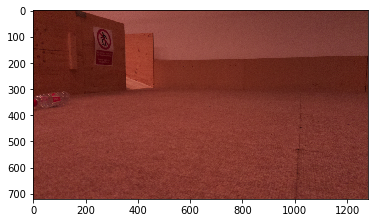

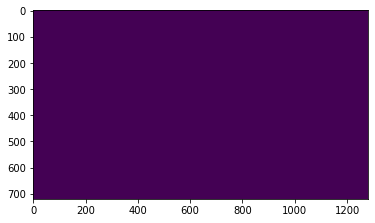

corners [[[ 13. 331.]]

 [[ 27. 333.]]

 [[ 58. 321.]]

 [[ 17. 342.]]

 [[112. 314.]]

 [[ 73. 356.]]

 [[ 37. 367.]]

 [[ 40. 321.]]

 [[356. 256.]]

 [[609. 214.]]]
detected corners


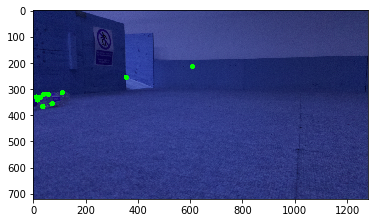

neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 0
neighbours 0
[DETECTION] Found a bottle at position  [ 62 340]
[DETECTION] detection time:  0.43785810470581055 seconds


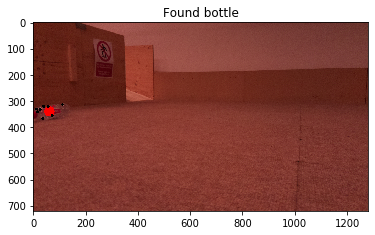

In [3]:
i = 1
while i < 2:
    img_name = "images/noIR/image3.jpg"
    print(img_name)
    plt.imshow(plt.imread(img_name))
    plt.show()
    img = cv.imread(img_name)
    #plt.imshow(img)
    #plt.show()
    has_bottle, center, img_out = detect_bottle(img)

    img_out = cv.cvtColor(img_out, cv.COLOR_BGR2RGB)

    plt.figure()
    if has_bottle:
        plt.title("Found bottle")
    else:
        plt.title("No bottle found")
    plt.imshow(img_out)
    plt.show()
    i += 1


pImages/frontal_img0.jpg


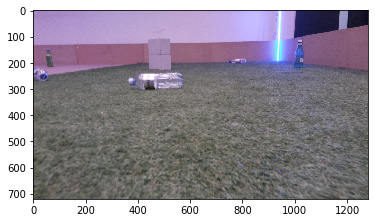

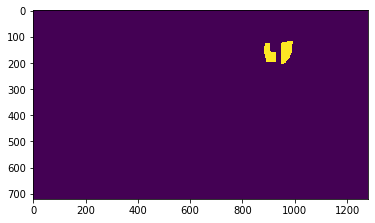

corners [[[420. 254.]]

 [[ 40. 232.]]

 [[ 34. 240.]]

 [[528. 249.]]

 [[475. 250.]]

 [[444. 266.]]

 [[569. 266.]]

 [[478. 294.]]

 [[499. 244.]]

 [[  6. 239.]]]
detected corners


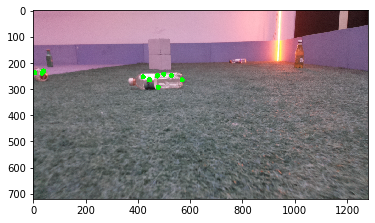

neighbours 4
neighbours 2
neighbours 2
neighbours 5
neighbours 6
neighbours 5
neighbours 4
neighbours 6
neighbours 6
neighbours 2
[DETECTION] Found a bottle at position  [487 269]
[DETECTION] detection time:  0.48993587493896484 seconds


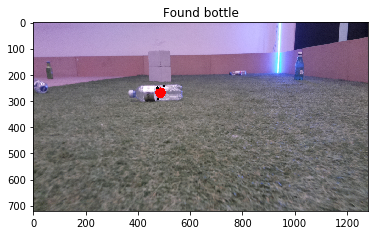

pImages/frontal_img1.jpg


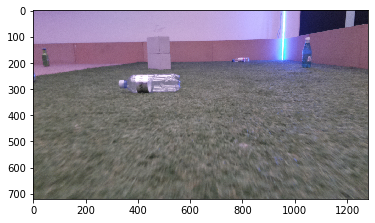

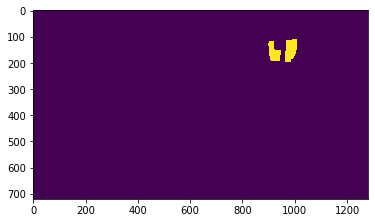

corners [[[389. 261.]]

 [[459. 250.]]

 [[512. 255.]]

 [[526. 266.]]

 [[526. 248.]]

 [[463. 295.]]

 [[559. 274.]]

 [[480. 249.]]

 [[488. 295.]]

 [[439. 259.]]]
detected corners


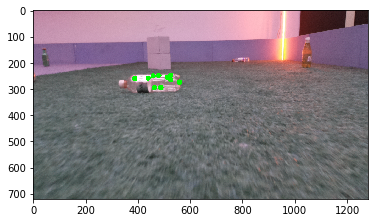

neighbours 4
neighbours 8
neighbours 8
neighbours 8
neighbours 8
neighbours 9
neighbours 6
neighbours 9
neighbours 8
neighbours 8
[DETECTION] Found a bottle at position  [499 271]
[DETECTION] detection time:  0.6805131435394287 seconds


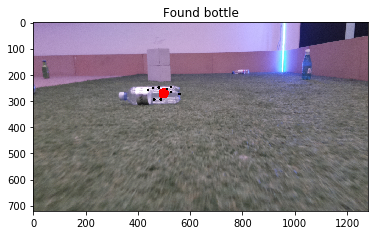

pImages/frontal_img2.jpg


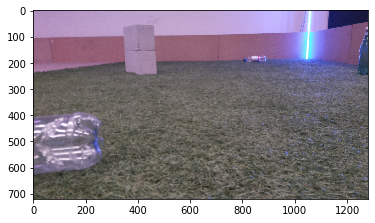

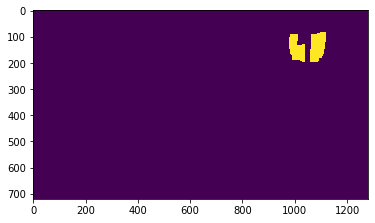

corners [[[1245.  202.]]

 [[1243.  216.]]

 [[1276.  226.]]

 [[ 189.  467.]]

 [[ 213.  473.]]

 [[1130.  597.]]

 [[1244.  536.]]

 [[1012.  507.]]

 [[ 890.  472.]]

 [[1246.  234.]]]
detected corners


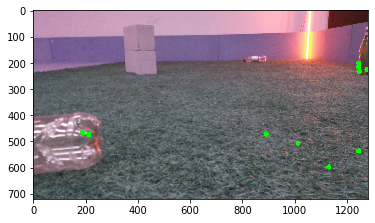

neighbours 3
neighbours 3
neighbours 3
neighbours 1
neighbours 1
neighbours 0
neighbours 0
neighbours 0
neighbours 0
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.684528112411499 seconds


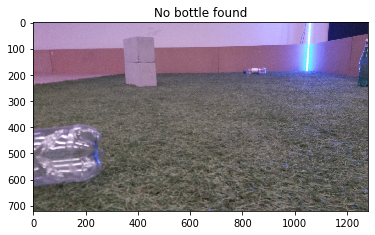

pImages/frontal_img3.jpg


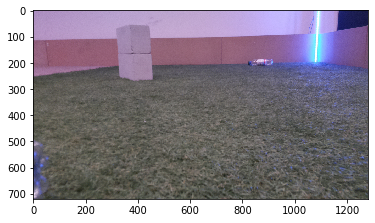

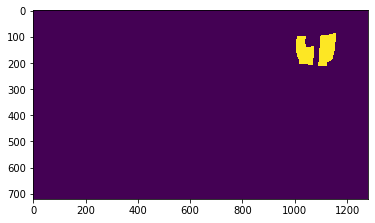

corners [[[ 851.  208.]]

 [[ 890.  210.]]

 [[ 907.  206.]]

 [[1058.  493.]]

 [[1103.  248.]]

 [[1115.  387.]]

 [[1090.  301.]]

 [[ 428.  424.]]

 [[1079.  329.]]

 [[ 839.  207.]]]
detected corners


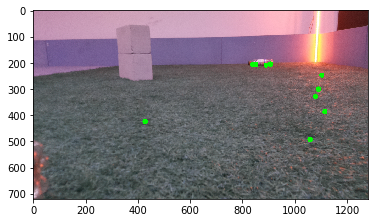

neighbours 3
neighbours 3
neighbours 3
neighbours 0
neighbours 2
neighbours 2
neighbours 3
neighbours 0
neighbours 3
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6705372333526611 seconds


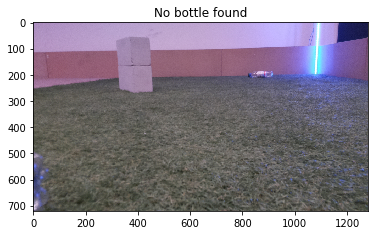

pImages/frontal_img4.jpg


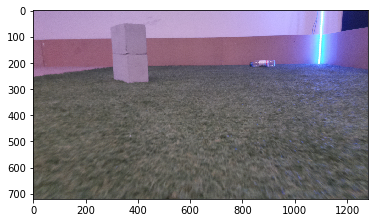

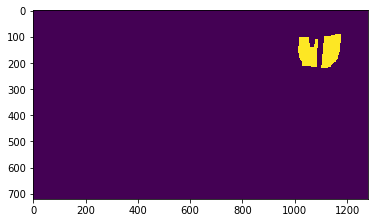

corners [[[ 898.  215.]]

 [[ 858.  213.]]

 [[ 915.  211.]]

 [[ 861.  203.]]

 [[ 893.  202.]]

 [[ 924.  202.]]

 [[ 832.  202.]]

 [[1090.  203.]]

 [[ 845.  212.]]

 [[1097.  274.]]]
detected corners


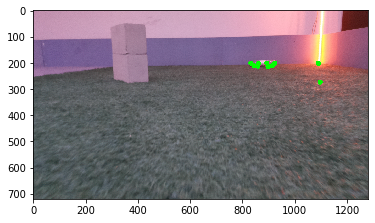

neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 1
neighbours 7
neighbours 1
[DETECTION] Found a bottle at position  [878 208]
[DETECTION] detection time:  0.6706948280334473 seconds


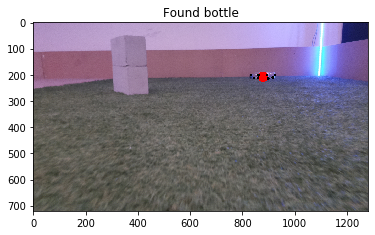

pImages/frontal_img5.jpg


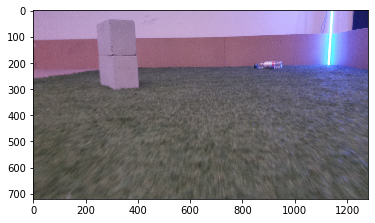

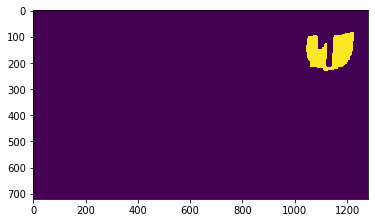

corners [[[942. 218.]]

 [[878. 220.]]

 [[873. 206.]]

 [[925. 203.]]

 [[937. 204.]]

 [[922. 222.]]

 [[883. 201.]]

 [[913. 206.]]

 [[951. 208.]]

 [[864. 218.]]]
detected corners


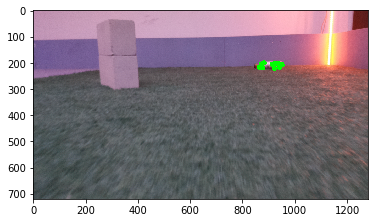

neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
[DETECTION] Found a bottle at position  [907 211]
[DETECTION] detection time:  0.5413329601287842 seconds


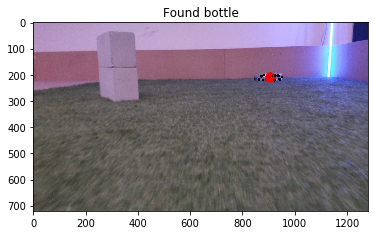

pImages/frontal_img6.jpg


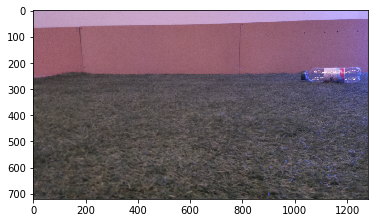

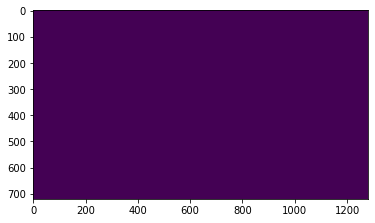

corners [[[1073.  234.]]

 [[1089.  231.]]

 [[1104.  262.]]

 [[1104.  238.]]

 [[1198.  232.]]

 [[1208.  233.]]

 [[1091.  262.]]

 [[1223.  265.]]

 [[1066.  262.]]

 [[1077.  258.]]]
detected corners


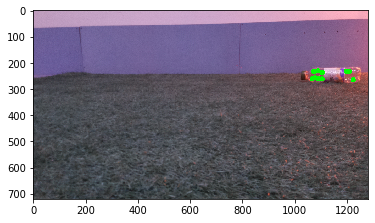

neighbours 6
neighbours 6
neighbours 7
neighbours 7
neighbours 4
neighbours 2
neighbours 6
neighbours 2
neighbours 6
neighbours 6
[DETECTION] Found a bottle at position  [1085  246]
[DETECTION] detection time:  0.6522209644317627 seconds


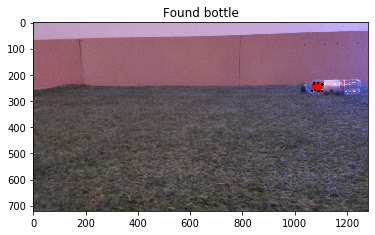

pImages/frontal_img7.jpg


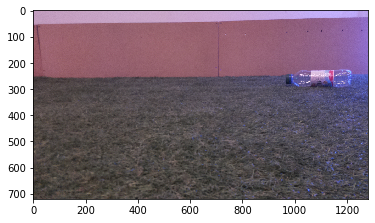

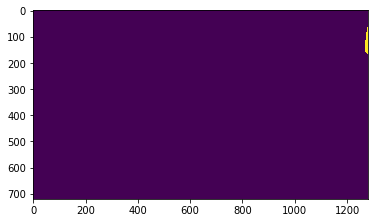

corners [[[1055.  250.]]

 [[1037.  242.]]

 [[1053.  277.]]

 [[1020.  246.]]

 [[1155.  248.]]

 [[1039.  277.]]

 [[1174.  242.]]

 [[1016.  279.]]

 [[1197.  239.]]

 [[1163.  279.]]]
detected corners


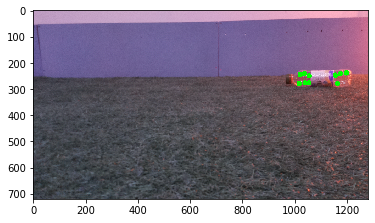

neighbours 5
neighbours 5
neighbours 5
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6828858852386475 seconds


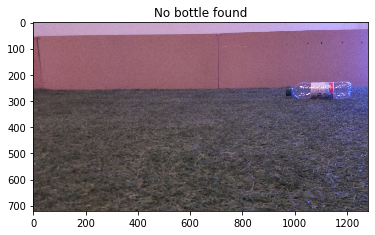

pImages/frontal_img8.jpg


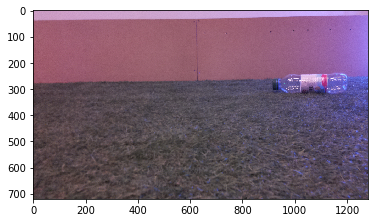

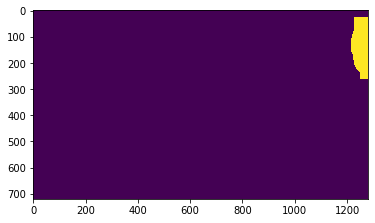

corners [[[1011.  298.]]

 [[1018.  268.]]

 [[ 976.  263.]]

 [[ 996.  260.]]

 [[1133.  266.]]

 [[ 997.  298.]]

 [[1138.  301.]]

 [[ 967.  299.]]

 [[1183.  254.]]

 [[1155.  264.]]]
detected corners


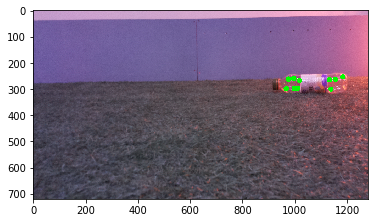

neighbours 5
neighbours 5
neighbours 5
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6912038326263428 seconds


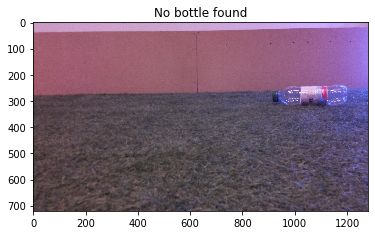

pImages/frontal_img9.jpg


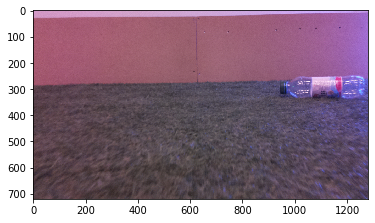

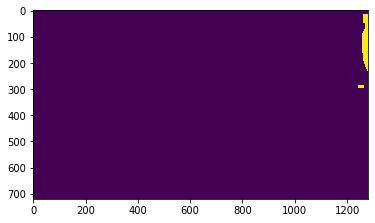

corners [[[1050.  314.]]

 [[1034.  270.]]

 [[1190.  278.]]

 [[1012.  275.]]

 [[1023.  270.]]

 [[1000.  314.]]

 [[1022.  280.]]

 [[1216.  278.]]

 [[1015.  307.]]

 [[1014.  317.]]]
detected corners


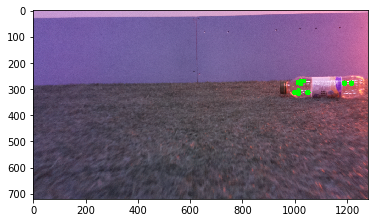

neighbours 7
neighbours 7
neighbours 1
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 1
neighbours 7
neighbours 7
[DETECTION] Found a bottle at position  [1025  293]
[DETECTION] detection time:  0.7885129451751709 seconds


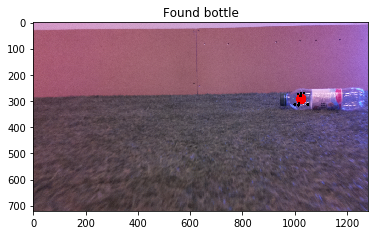

pImages/frontal_img10.jpg


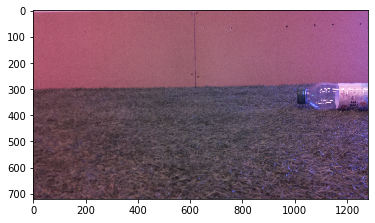

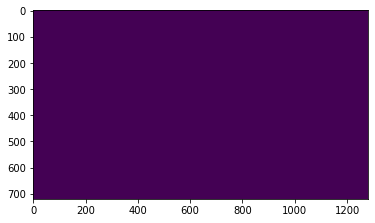

corners [[[1144.  344.]]

 [[1134.  299.]]

 [[1138.  352.]]

 [[1114.  298.]]

 [[1098.  305.]]

 [[1081.  353.]]

 [[1116.  355.]]

 [[1113.  310.]]

 [[1110.  344.]]

 [[1097.  315.]]]
detected corners


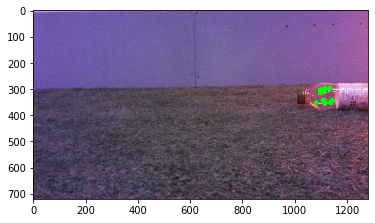

neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
[DETECTION] Found a bottle at position  [1112  326]
[DETECTION] detection time:  0.6898927688598633 seconds


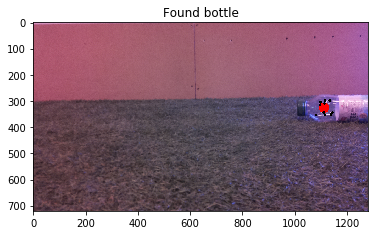

pImages/frontal_img11.jpg


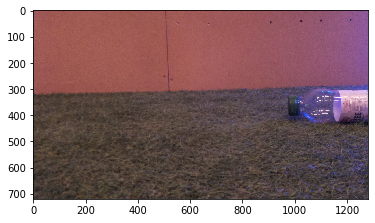

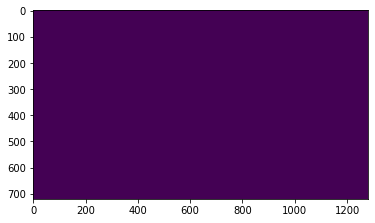

corners [[[1129.  329.]]

 [[1125.  394.]]

 [[1105.  326.]]

 [[1086.  336.]]

 [[1116.  326.]]

 [[1100.  344.]]

 [[1068.  397.]]

 [[1135.  342.]]

 [[1088.  347.]]

 [[1149.  331.]]]
detected corners


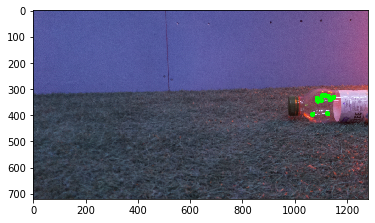

neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 9
neighbours 8
neighbours 9
neighbours 9
neighbours 8
[DETECTION] Found a bottle at position  [1108  361]
[DETECTION] detection time:  0.7327139377593994 seconds


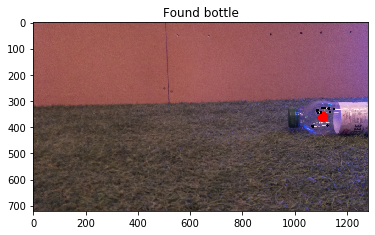

pImages/frontal_img12.jpg


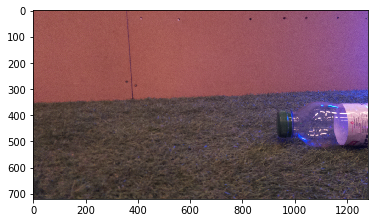

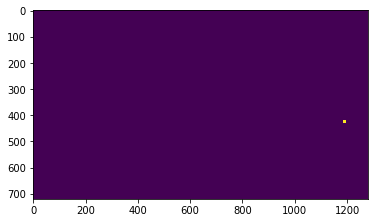

corners [[[1053.  476.]]

 [[1120.  471.]]

 [[1126.  457.]]

 [[1083.  478.]]

 [[1080.  400.]]

 [[1135.  389.]]

 [[1147.  407.]]

 [[1163.  408.]]

 [[1090.  413.]]

 [[1120.  392.]]]
detected corners


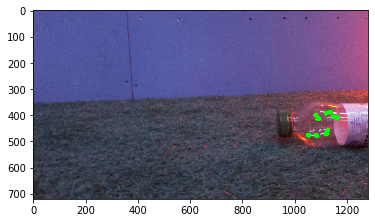

neighbours 5
neighbours 9
neighbours 9
neighbours 7
neighbours 9
neighbours 7
neighbours 8
neighbours 7
neighbours 9
neighbours 8
[DETECTION] Found a bottle at position  [1121  433]
[DETECTION] detection time:  0.6713390350341797 seconds


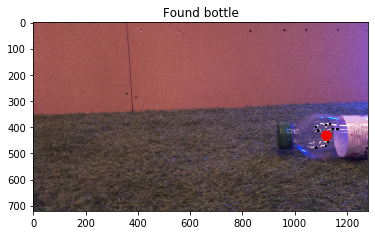

pImages/frontal_img13.jpg


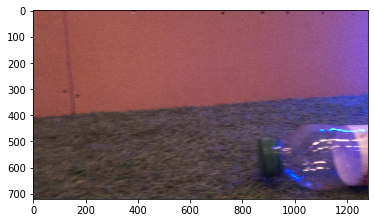

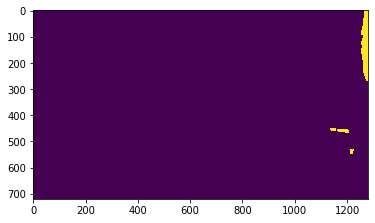

corners [[[1117.  580.]]

 [[1084.  602.]]

 [[1087.  529.]]

 [[1067.  512.]]

 [[1032.  610.]]

 [[1195.  520.]]

 [[1110.  602.]]

 [[1208.  497.]]

 [[1092.  504.]]

 [[1061.  608.]]]
detected corners


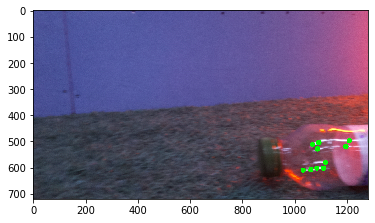

neighbours 8
neighbours 7
neighbours 7
neighbours 6
neighbours 5
neighbours 2
neighbours 7
neighbours 1
neighbours 5
neighbours 6
[DETECTION] Found a bottle at position  [1089  560]
[DETECTION] detection time:  0.44910717010498047 seconds


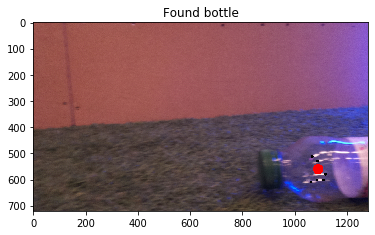

pImages/frontal_img14.jpg


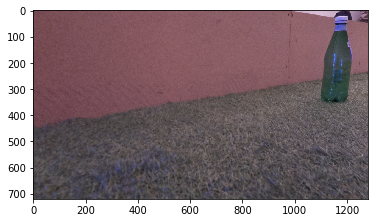

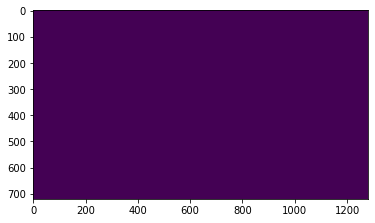

corners [[[1139.  302.]]

 [[1182.  315.]]

 [[1129.  341.]]

 [[1223.  295.]]

 [[1147.  248.]]

 [[1206.  325.]]

 [[1149.  202.]]

 [[1149.  216.]]

 [[1228.  361.]]

 [[1044.  398.]]]
detected corners


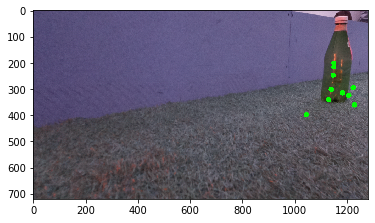

neighbours 6
neighbours 6
neighbours 4
neighbours 5
neighbours 7
neighbours 6
neighbours 2
neighbours 3
neighbours 3
neighbours 0
[DETECTION] Found a bottle at position  [1172  286]
[DETECTION] detection time:  0.42243123054504395 seconds


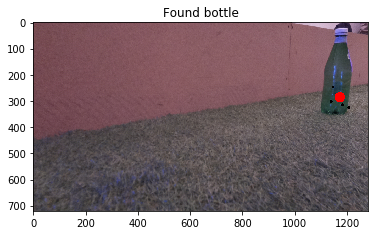

pImages/frontal_img15.jpg


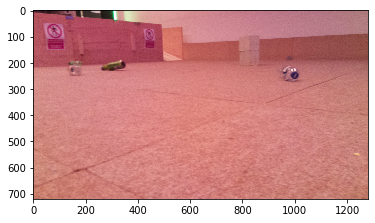

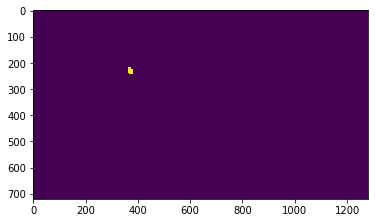

corners [[[ 996.  222.]]

 [[ 993.  233.]]

 [[ 963.  234.]]

 [[ 983.  226.]]

 [[1003.  232.]]

 [[ 982.  216.]]

 [[ 170.  214.]]

 [[ 977.  234.]]

 [[ 966.  269.]]

 [[ 988.  260.]]]
detected corners


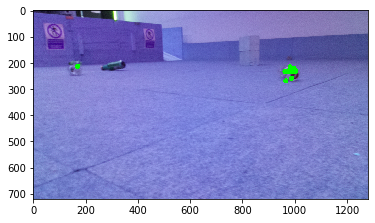

neighbours 8
neighbours 8
neighbours 8
neighbours 8
neighbours 8
neighbours 8
neighbours 0
neighbours 8
neighbours 8
neighbours 8
[DETECTION] Found a bottle at position  [983 242]
[DETECTION] detection time:  0.645230770111084 seconds


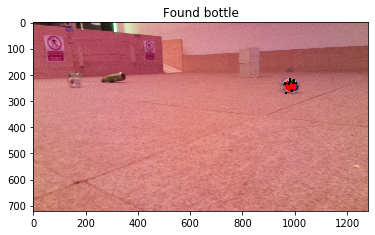

pImages/frontal_img16.jpg


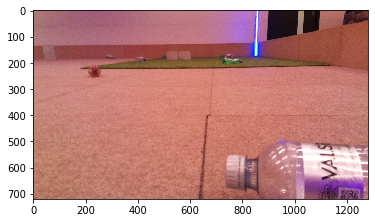

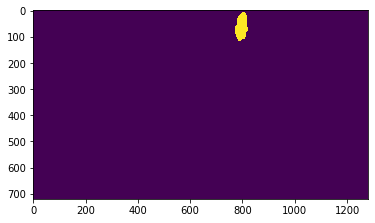

corners [[[1097.  549.]]

 [[1104.  601.]]

 [[ 214.  228.]]

 [[1254.  531.]]

 [[1138.  624.]]

 [[1104.  581.]]

 [[1123.  582.]]

 [[1159.  606.]]

 [[1135.  530.]]

 [[1141.  596.]]]
detected corners


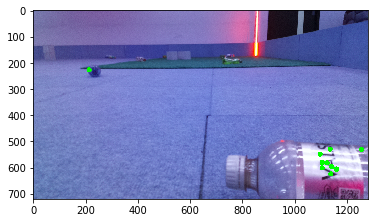

neighbours 7
neighbours 7
neighbours 0
neighbours 0
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 7
neighbours 7
[DETECTION] Found a bottle at position  [1128  577]
[DETECTION] detection time:  0.6479558944702148 seconds


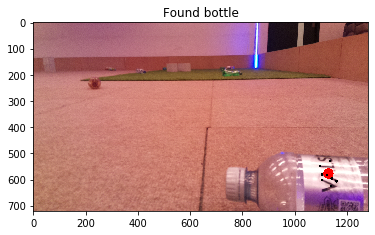

pImages/frontal_img17.jpg


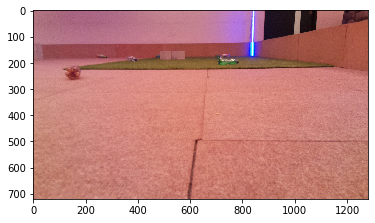

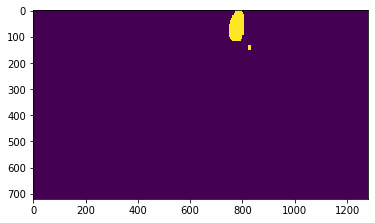

corners [[[ 128.  234.]]

 [[ 170.  239.]]

 [[1050.  313.]]

 [[1095.  263.]]

 [[1235.  305.]]

 [[1189.  433.]]

 [[ 875.  336.]]

 [[ 153.  219.]]

 [[ 927.  321.]]

 [[1021.  265.]]]
detected corners


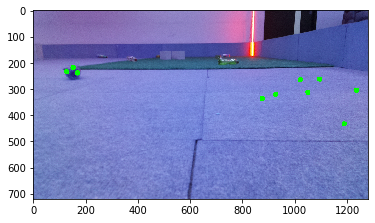

neighbours 2
neighbours 2
neighbours 2
neighbours 2
neighbours 0
neighbours 0
neighbours 1
neighbours 2
neighbours 1
neighbours 2
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6593029499053955 seconds


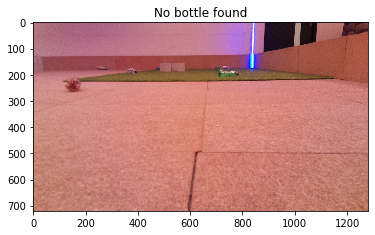

pImages/frontal_img18.jpg


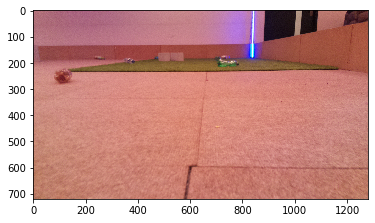

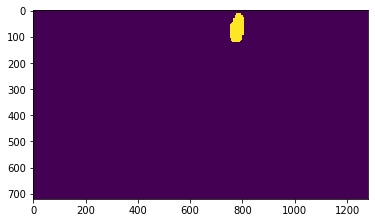

corners [[[ 758.  202.]]

 [[ 132.  251.]]

 [[1123.  279.]]

 [[  86.  246.]]

 [[ 895.  366.]]

 [[1086.  337.]]

 [[ 113.  229.]]

 [[ 147.  238.]]

 [[ 950.  348.]]

 [[ 780.  209.]]]
detected corners


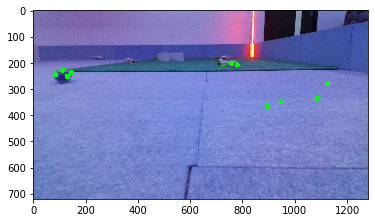

neighbours 1
neighbours 3
neighbours 1
neighbours 3
neighbours 1
neighbours 1
neighbours 3
neighbours 3
neighbours 1
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5871279239654541 seconds


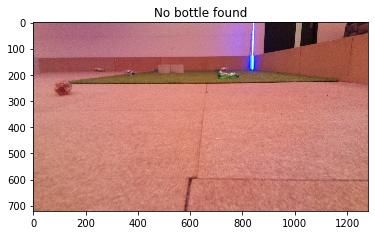

pImages/frontal_img19.jpg


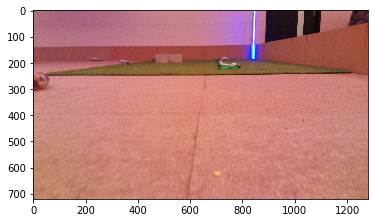

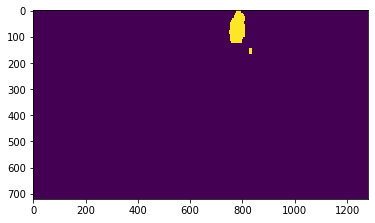

corners [[[ 772.  207.]]

 [[ 762.  211.]]

 [[  33.  274.]]

 [[ 722.  208.]]

 [[ 711.  202.]]

 [[1207.  310.]]

 [[ 785.  220.]]

 [[1077.  240.]]

 [[   6.  247.]]

 [[  57.  252.]]]
detected corners


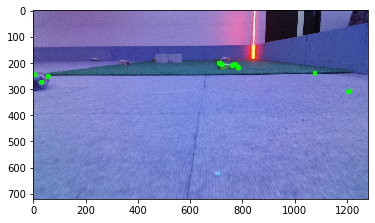

neighbours 4
neighbours 4
neighbours 2
neighbours 4
neighbours 4
neighbours 0
neighbours 4
neighbours 0
neighbours 2
neighbours 2
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5917739868164062 seconds


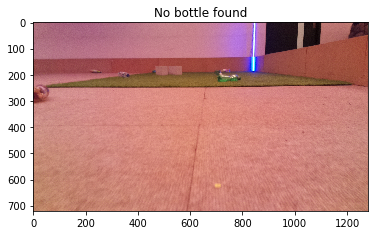

pImages/frontal_img20.jpg


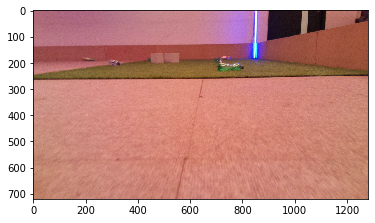

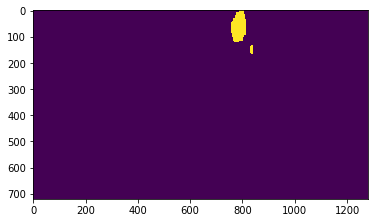

corners [[[781. 209.]]

 [[769. 214.]]

 [[731. 211.]]

 [[720. 206.]]

 [[796. 223.]]

 [[304. 201.]]

 [[908. 255.]]

 [[709. 206.]]

 [[646. 331.]]

 [[766. 258.]]]
detected corners


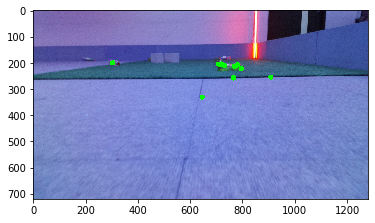

neighbours 6
neighbours 6
neighbours 6
neighbours 6
neighbours 6
neighbours 0
neighbours 0
neighbours 6
neighbours 0
neighbours 6
[DETECTION] Found a bottle at position  [752 232]
[DETECTION] detection time:  0.666884183883667 seconds


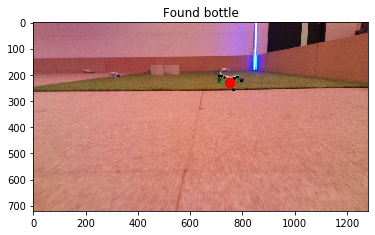

pImages/frontal_img21.jpg


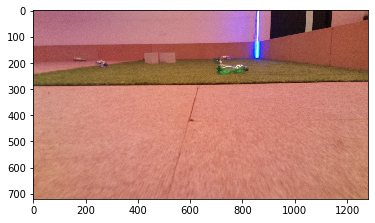

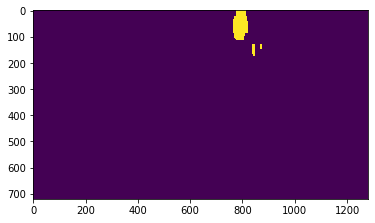

corners [[[779. 221.]]

 [[794. 216.]]

 [[735. 218.]]

 [[255. 201.]]

 [[715. 204.]]

 [[724. 212.]]

 [[961. 277.]]

 [[811. 232.]]

 [[810. 215.]]

 [[714. 218.]]]
detected corners


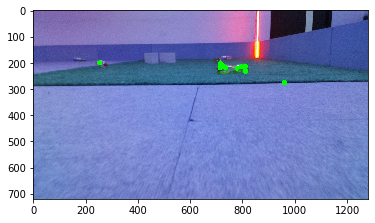

neighbours 7
neighbours 7
neighbours 7
neighbours 0
neighbours 6
neighbours 7
neighbours 0
neighbours 6
neighbours 7
neighbours 7
[DETECTION] Found a bottle at position  [762 218]
[DETECTION] detection time:  0.6326189041137695 seconds


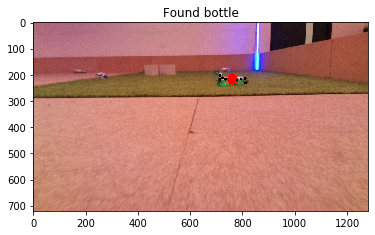

pImages/frontal_img22.jpg


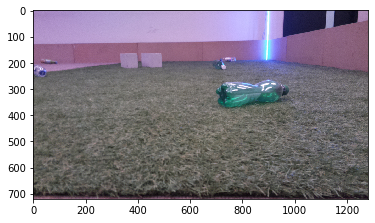

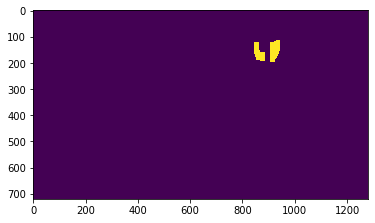

corners [[[780. 293.]]

 [[875. 305.]]

 [[871. 286.]]

 [[782. 304.]]

 [[949. 288.]]

 [[723. 207.]]

 [[738. 307.]]

 [[926. 282.]]

 [[911. 281.]]

 [[709. 210.]]]
detected corners


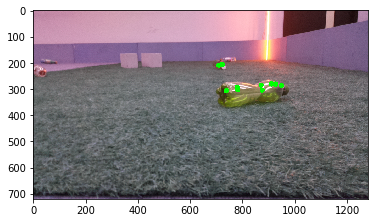

neighbours 4
neighbours 6
neighbours 6
neighbours 4
neighbours 4
neighbours 1
neighbours 2
neighbours 4
neighbours 4
neighbours 1
[DETECTION] Found a bottle at position  [873 295]
[DETECTION] detection time:  0.6176331043243408 seconds


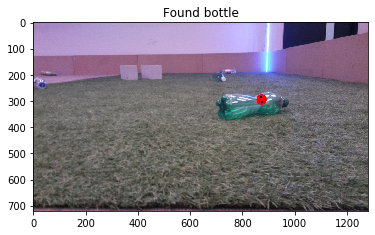

pImages/frontal_img23.jpg


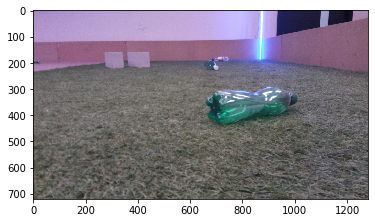

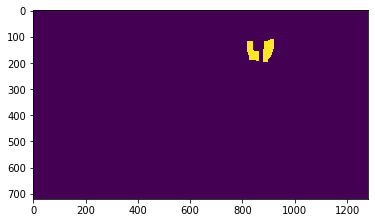

corners [[[ 693.  208.]]

 [[ 763.  331.]]

 [[ 877.  319.]]

 [[ 677.  209.]]

 [[ 946.  311.]]

 [[ 974.  316.]]

 [[ 889.  343.]]

 [[ 742.  351.]]

 [[ 768.  345.]]

 [[1254.  474.]]]
detected corners


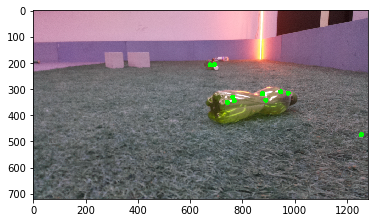

neighbours 1
neighbours 2
neighbours 3
neighbours 1
neighbours 3
neighbours 3
neighbours 3
neighbours 2
neighbours 2
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.676051139831543 seconds


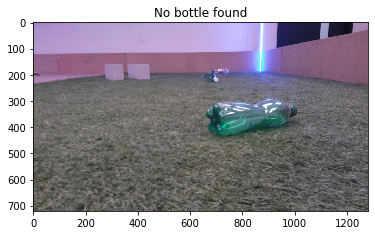

pImages/frontal_img24.jpg


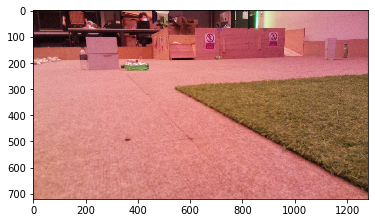

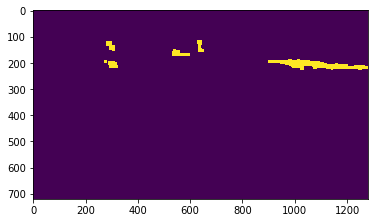

corners [[[ 406.  207.]]

 [[ 378.  205.]]

 [[ 367.  208.]]

 [[ 419.  208.]]

 [[1198.  247.]]

 [[ 433.  207.]]

 [[ 390.  209.]]

 [[1109.  493.]]

 [[ 343.  213.]]

 [[1079.  574.]]]
detected corners


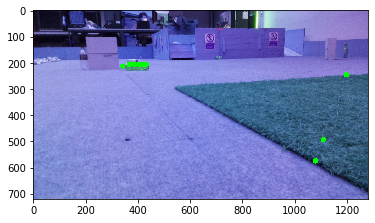

neighbours 6
neighbours 6
neighbours 6
neighbours 6
neighbours 0
neighbours 6
neighbours 6
neighbours 1
neighbours 6
neighbours 1
[DETECTION] Found a bottle at position  [388 209]
[DETECTION] detection time:  0.6339988708496094 seconds


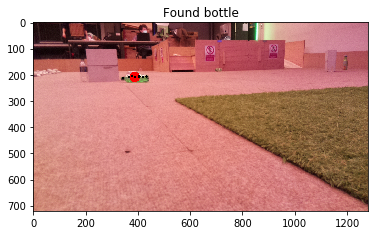

pImages/frontal_img25.jpg


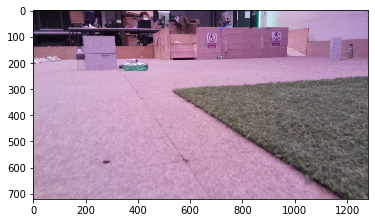

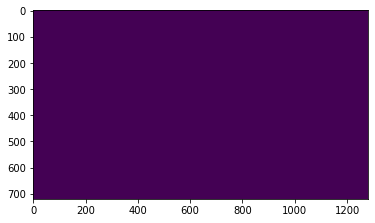

corners [[[361. 209.]]

 [[394. 207.]]

 [[414. 209.]]

 [[434. 205.]]

 [[384. 204.]]

 [[372. 208.]]

 [[  9. 204.]]

 [[336. 213.]]

 [[348. 204.]]

 [[329. 221.]]]
detected corners


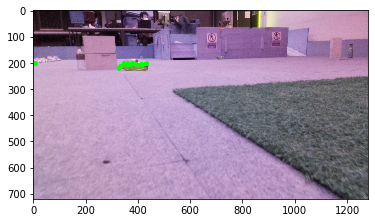

neighbours 8
neighbours 8
neighbours 8
neighbours 7
neighbours 8
neighbours 8
neighbours 0
neighbours 8
neighbours 8
neighbours 7
[DETECTION] Found a bottle at position  [381 212]
[DETECTION] detection time:  0.6587669849395752 seconds


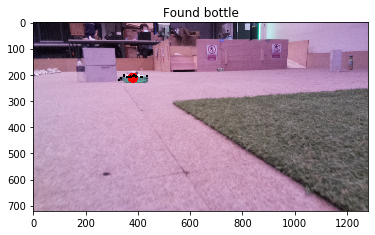

pImages/frontal_img26.jpg


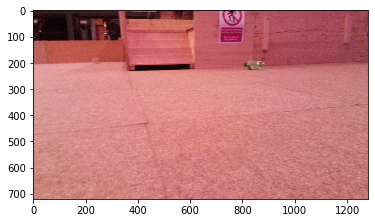

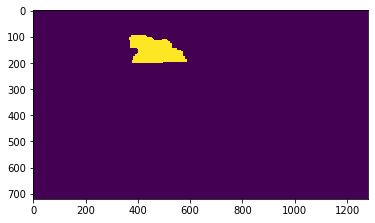

corners [[[833. 216.]]

 [[882. 203.]]

 [[614. 222.]]

 [[836. 226.]]

 [[856. 202.]]

 [[368. 230.]]

 [[389. 212.]]

 [[861. 220.]]

 [[598. 207.]]

 [[440. 431.]]]
detected corners


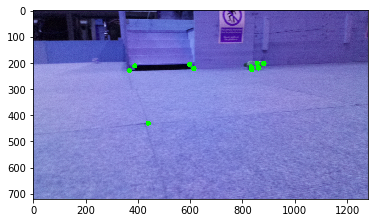

neighbours 4
neighbours 4
neighbours 1
neighbours 4
neighbours 4
neighbours 1
neighbours 1
neighbours 4
neighbours 1
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5118038654327393 seconds


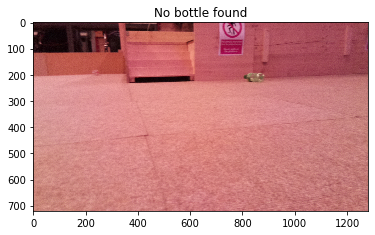

pImages/frontal_img27.jpg


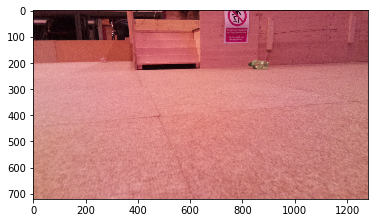

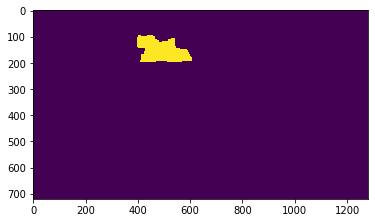

corners [[[ 852.  213.]]

 [[ 895.  202.]]

 [[ 637.  220.]]

 [[ 418.  209.]]

 [[ 882.  216.]]

 [[ 874.  204.]]

 [[ 621.  204.]]

 [[ 854.  224.]]

 [[ 893.  219.]]

 [[1111.  405.]]]
detected corners


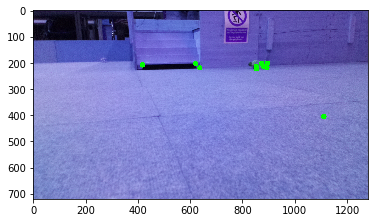

neighbours 5
neighbours 5
neighbours 1
neighbours 0
neighbours 5
neighbours 5
neighbours 1
neighbours 5
neighbours 5
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6398601531982422 seconds


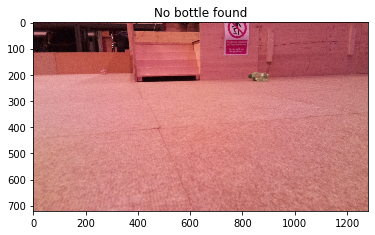

pImages/frontal_img28.jpg


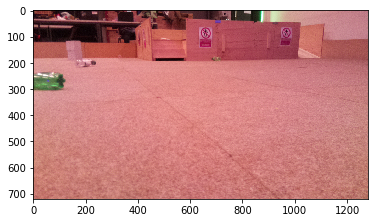

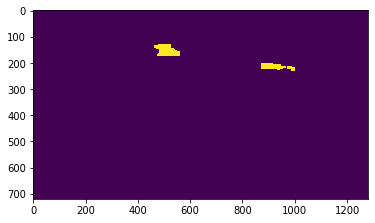

corners [[[  79.  255.]]

 [[  76.  242.]]

 [[  23.  255.]]

 [[1206.  343.]]

 [[1092.  345.]]

 [[  18.  243.]]

 [[ 217.  207.]]

 [[  38.  247.]]

 [[  57.  251.]]

 [[ 198.  202.]]]
detected corners


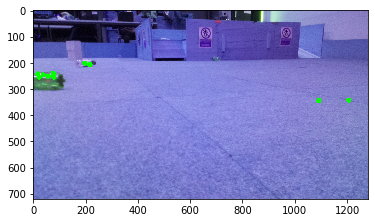

neighbours 5
neighbours 5
neighbours 5
neighbours 0
neighbours 0
neighbours 5
neighbours 1
neighbours 5
neighbours 5
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6130101680755615 seconds


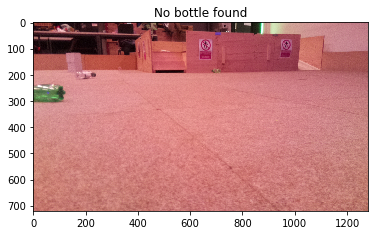

pImages/frontal_img29.jpg


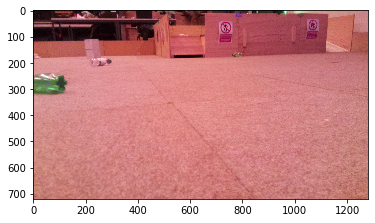

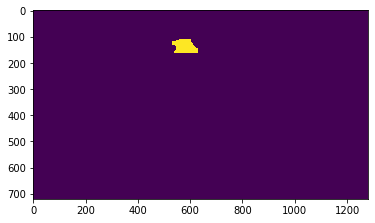

corners [[[  7. 260.]]

 [[ 81. 263.]]

 [[276. 202.]]

 [[ 28. 261.]]

 [[252. 207.]]

 [[ 29. 249.]]

 [[298. 201.]]

 [[ 56. 266.]]

 [[230. 203.]]

 [[ 43. 263.]]]
detected corners


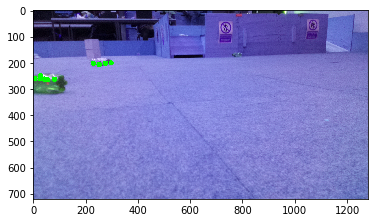

neighbours 5
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 5
neighbours 3
neighbours 5
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.669929027557373 seconds


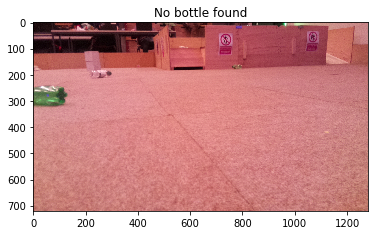

pImages/frontal_img30.jpg


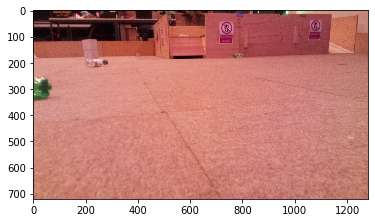

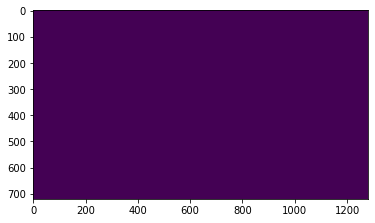

corners [[[  7. 276.]]

 [[261. 206.]]

 [[236. 211.]]

 [[ 19. 274.]]

 [[954. 283.]]

 [[ 15. 259.]]

 [[ 33. 259.]]

 [[211. 210.]]

 [[954. 358.]]

 [[493. 389.]]]
detected corners


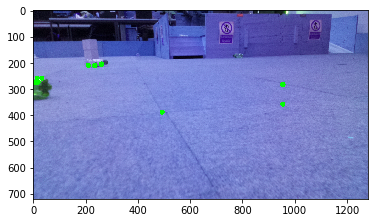

neighbours 3
neighbours 2
neighbours 2
neighbours 3
neighbours 1
neighbours 3
neighbours 3
neighbours 2
neighbours 1
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.670809268951416 seconds


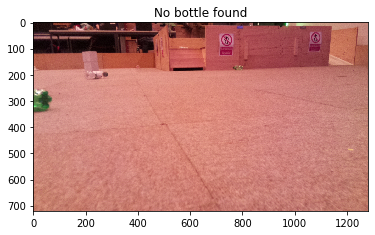

pImages/frontal_img31.jpg


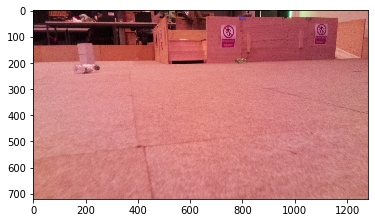

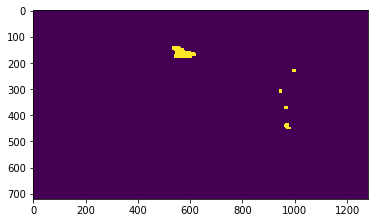

corners [[[226. 228.]]

 [[533. 203.]]

 [[786. 201.]]

 [[200. 221.]]

 [[229. 213.]]

 [[652. 201.]]

 [[194. 240.]]

 [[179. 211.]]

 [[168. 232.]]

 [[517. 204.]]]
detected corners


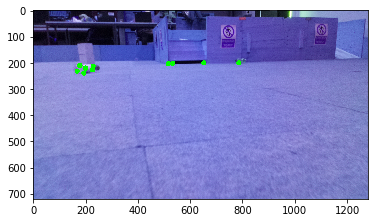

neighbours 5
neighbours 1
neighbours 0
neighbours 5
neighbours 5
neighbours 0
neighbours 5
neighbours 5
neighbours 5
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6477608680725098 seconds


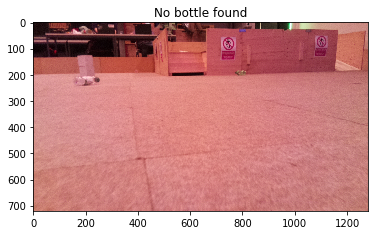

pImages/frontal_img32.jpg


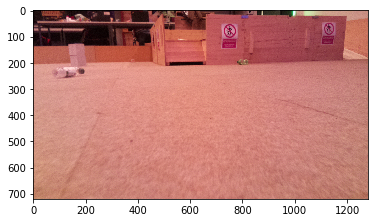

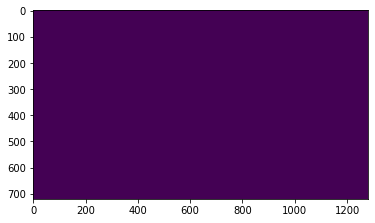

corners [[[797. 202.]]

 [[521. 210.]]

 [[161. 241.]]

 [[116. 223.]]

 [[650. 207.]]

 [[128. 234.]]

 [[886. 270.]]

 [[812. 202.]]

 [[660. 207.]]

 [[165. 225.]]]
detected corners


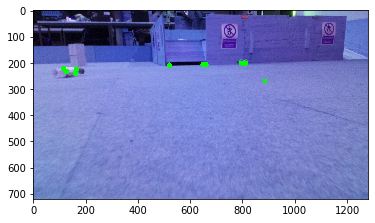

neighbours 1
neighbours 0
neighbours 3
neighbours 3
neighbours 1
neighbours 3
neighbours 0
neighbours 1
neighbours 1
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6372878551483154 seconds


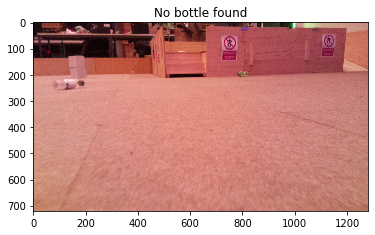

pImages/frontal_img33.jpg


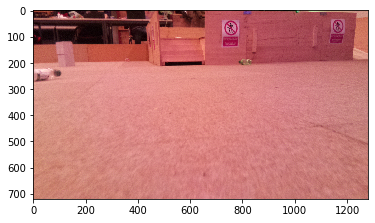

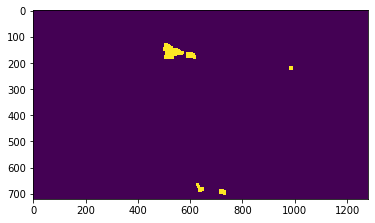

corners [[[805. 203.]]

 [[822. 203.]]

 [[645. 207.]]

 [[504. 211.]]

 [[ 63. 222.]]

 [[656. 208.]]

 [[ 60. 251.]]

 [[ 17. 242.]]

 [[934. 295.]]

 [[ 65. 232.]]]
detected corners


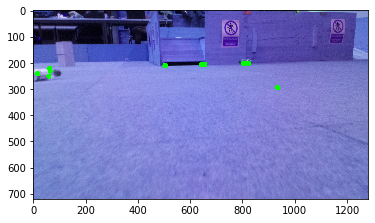

neighbours 1
neighbours 1
neighbours 1
neighbours 0
neighbours 3
neighbours 1
neighbours 3
neighbours 3
neighbours 0
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6988842487335205 seconds


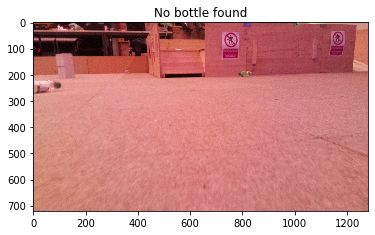

pImages/frontal_img34.jpg


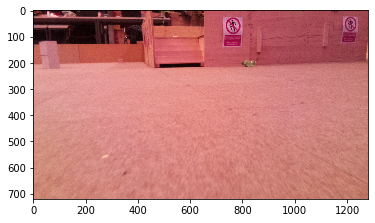

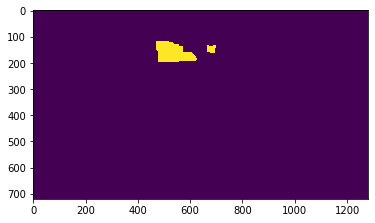

corners [[[819. 209.]]

 [[484. 218.]]

 [[833. 201.]]

 [[484. 206.]]

 [[840. 210.]]

 [[652. 214.]]

 [[640. 202.]]

 [[807. 203.]]

 [[640. 214.]]

 [[853. 398.]]]
detected corners


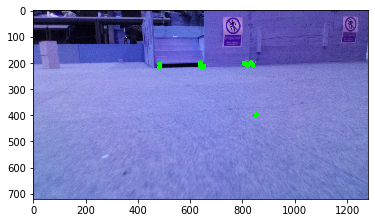

neighbours 3
neighbours 1
neighbours 3
neighbours 1
neighbours 3
neighbours 2
neighbours 2
neighbours 3
neighbours 2
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6972141265869141 seconds


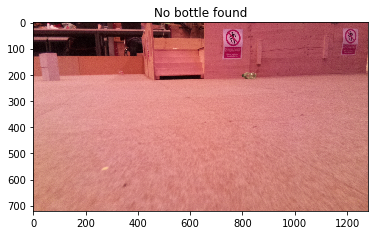

pImages/frontal_img35.jpg


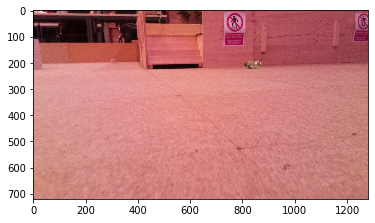

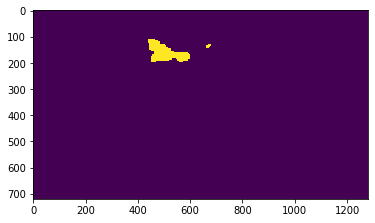

corners [[[833. 213.]]

 [[868. 203.]]

 [[457. 209.]]

 [[633. 205.]]

 [[857. 215.]]

 [[646. 219.]]

 [[850. 204.]]

 [[457. 223.]]

 [[820. 207.]]

 [[441. 224.]]]
detected corners


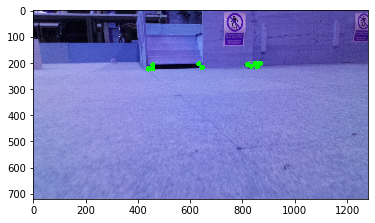

neighbours 4
neighbours 4
neighbours 2
neighbours 1
neighbours 4
neighbours 1
neighbours 4
neighbours 2
neighbours 4
neighbours 2
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6437981128692627 seconds


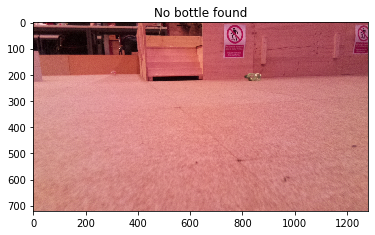

pImages/frontal_img36.jpg


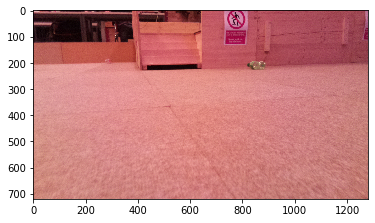

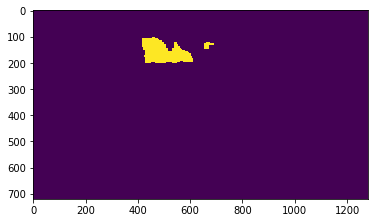

corners [[[884. 204.]]

 [[845. 215.]]

 [[642. 222.]]

 [[864. 206.]]

 [[871. 218.]]

 [[436. 212.]]

 [[846. 225.]]

 [[436. 227.]]

 [[627. 206.]]

 [[418. 228.]]]
detected corners


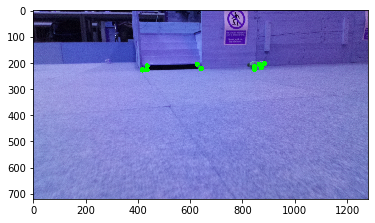

neighbours 4
neighbours 4
neighbours 1
neighbours 4
neighbours 4
neighbours 2
neighbours 4
neighbours 2
neighbours 1
neighbours 2
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6761400699615479 seconds


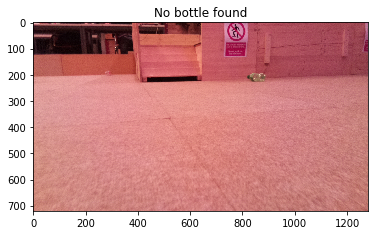

In [5]:
i = 0
while i < 37:
    img_name = "pImages/frontal_img"+str(i)+".jpg"
    print(img_name)
    plt.imshow(plt.imread(img_name))
    plt.show()
    img = cv.imread(img_name)
    #plt.imshow(img)
    #plt.show()
    has_bottle, center, img_out = detect_bottle(img)

    img_out = cv.cvtColor(img_out, cv.COLOR_BGR2RGB)

    plt.figure()
    if has_bottle:
        plt.title("Found bottle")
    else:
        plt.title("No bottle found")
    plt.imshow(img_out)
    plt.show()
    i += 1